In [1]:
pip install numpy matplotlib pillow

  Using cached pillow-11.2.1-cp312-cp312-macosx_11_0_arm64.whl.metadata (8.9 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 17.8 MB/s eta 0:00:0031m16.9 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 26.5 MB/s eta 0:00:00 MB/s eta 0:00:01
Using cached pillow-11.2.1-cp312-cp312-macosx_11_0_arm64.whl (3.0 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 22.9 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


Matplotlib is building the font cache; this may take a moment.


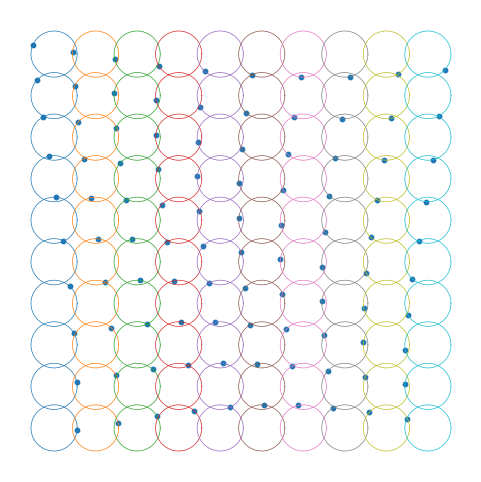

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

# --- Parâmetros ---
rows, cols     = 10, 10            # número de linhas e colunas de círculos
radius         = 1.0               # raio de cada círculo
spacing        = 1.8               # distância entre centros (< 2*radius para sobreposição)
frames         = 60                # nº de quadros na animação
fps            = 15                # frames por segundo do GIF
resolution     = 80                # pontos para desenhar cada círculo
phase_step     = 2 * np.pi / (rows + cols)

# Pré-compute centros e fases
centers = [(i * spacing, j * spacing) 
           for j in range(rows) for i in range(cols)]
phi     = np.array([ (i + j) * phase_step 
                     for j in range(rows) for i in range(cols) ])

# Cria figura
fig, ax = plt.subplots(figsize=(6,6))
ax.set_aspect('equal')
ax.axis('off')

# Desenha todos os círculos estáticos
theta = np.linspace(0, 2*np.pi, resolution)
for (cx, cy) in centers:
    x = cx + radius * np.cos(theta)
    y = cy + radius * np.sin(theta)
    ax.plot(x, y, linewidth=0.5)

# Patches para os pontos móveis
scatter = ax.scatter([], [], s=10)

# Função de inicialização
def init():
    scatter.set_offsets(np.empty((0,2)))
    return (scatter,)

# Função de atualização por frame
def update(frame):
    ang = frame * (2*np.pi/frames) + phi
    xs  = [cx + radius*np.cos(a) for (cx,_), a in zip(centers, ang)]
    ys  = [cy + radius*np.sin(a) for (_,cy), a in zip(centers, ang)]
    scatter.set_offsets(np.c_[xs, ys])
    return (scatter,)

# Cria a animação
ani = animation.FuncAnimation(
    fig, update, frames=frames,
    init_func=init, blit=True,
    interval=1000/fps
)

# Salva em GIF
gif_path = 'wave_animation.gif'
ani.save(gif_path, writer=PillowWriter(fps=fps))

# Opcional: exibe no notebook (se estiver usando Jupyter)
from IPython.display import HTML
HTML(ani.to_jshtml())

#print(f"Animação salva em {gif_path}")
